<a href="https://colab.research.google.com/github/erizz2/PHYS220-Project/blob/main/PHYS220proj_FINAL_vers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# imports
from os import error
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import math
from scipy.integrate import quad
from IPython.display import HTML

In [ ]:
# functions

def gaussian(x,L):
    '''
    This function returns a Gaussian profile.

    Parameters:
    x (float): The position.
    L (float): The length of the rod.
    '''
    return 300 * np.exp(-150*(x-L/2)**2)


def explicit_method(k, h, t_max, alpha, BC1, BC2, L):

    '''
    This function uses the explicit method of calculating the solution the the heat equation.

    Parameters:
    k (float): The time step.
    h (float): The spatial step.
    t_max (float): The maximum time.
    alpha (float): The thermal diffusivity.
    BC1 (float): The left boundary condition.
    BC2 (float): The right boundary condition.
    L (float): the length of the rod.
    '''

    M = int(t_max / k) # number of time steps
    N = int(L / h) # number of spatial steps
    u = np.zeros([N+1, M+1], float) # initalize solution variable
    x = np.linspace(0, L, N+1)

    u[:,0] = gaussian(x,L) # initial spatial profile


    # boundary conditions
    u[0, :] = BC1
    u[N, :] = BC2

    r = alpha * k / h**2 # ratio of step sizes


    print("N =", N) # print parameters
    print("M =", M)
    print("h =", h)
    print("k =", k)
    print("r =", r)


    for n in range(M):
        for j in range(1, N):
            u[j, n+1] = (1 - 2*r)*u[j, n] + r*u[j-1, n] + r*u[j+1, n]

    return x, u

def implicit_method(k, h, t_max, alpha, BC1, BC2, L, target):

    '''
    This function uses the implicit method of calculating the solution the the heat equation.

    Parameters:
    k (float): The time step.
    h (float): The spatial step.
    t_max (float): The maximum time.
    T (float): The temperature.
    alpha (float): The thermal diffusivity.
    BC1 (float): The left boundary condition.
    BC2 (float): The right boundary condition.
    L = (float): the length of the rod.
    target (float): The accuracy condition.
    '''

    M = int(t_max / k) # number of time steps
    N = int(L / h) # number of spatial steps
    u = np.zeros([N+1, M+1], float) # initalize solution array
    x = np.linspace(0, L, N+1)

    u[:,0] = gaussian(x,L) # initial spatial profile


    # boundary conditions
    u[0, :] = BC1
    u[N, :] = BC2

    r = alpha * k / h**2

    print("N =", N) # print params
    print("M =", M)
    print("h =", h)
    print("k =", k)
    print("r =", r)


    for n in range(M):
        u[:, n+1] = u[:, n]
        u[0, n+1] = BC1
        u[N, n+1] = BC2

        delta = 1.0

        while delta > target:

          uprime = u[:, n+1].copy()

          for j in range(1, N):
            #uprime = u[:, n+1].copy()

            u[j, n+1] = 1 / (1 + 2*r) * (u[j, n] + r*u[j-1, n+1] + r*u[j+1, n+1])
          delta = np.max(np.abs(uprime - u[:, n+1]))

    return x, u

def plot_numerical_vs_analytical_snapshots(x_vals, u, L, alpha, t_max):
    '''
    This function overlays numerical snapshots with the corresponding analytical solution.

    Parameters:
    x_vals (array): The spatial values.
    u (array): The numerical solution.
    L (float): The length of the rod.
    alpha (float): The thermal diffusivity.
    t_max (float): The maximum time.
    '''

    #t_vals = np.linspace(0, t_max, u.shape[1])

    N_sol = 100
    B_list = compute_Bn_list(N_sol, L)

    times_to_plot=[0, 10, 25, 50, 100, 200]

    plt.figure()

    for t in times_to_plot:
        t_index = int(t / k)

        # avoid going past the array
        if t_index >= u.shape[1]:
            continue
        '''
        for t_index in time_indices:
            t = t_vals[t_index]
        '''
        # numerical solution at this time
        u_num = u[:, t_index]

        # analytical solution at this same time, evaluated on the same x grid
        u_exact = np.zeros(len(x_vals))
        for j, x in enumerate(x_vals):
            u_exact[j] = u_xt(x, t, L, alpha, B_list)

        plt.plot(x_vals, u_num, label=f"Numerical t={t:.2f}")
        plt.plot(x_vals, u_exact, "--", label=f"Analytical t={t:.2f}")

    plt.xlabel("x")
    plt.ylabel("u(x,t)")
    plt.title("Numerical vs Analytical Heat Equation Evolution")
    plt.legend()
    plt.show()
    return

def analytical_on_grid(x_vals, t, L, alpha):
    '''
    This function evaluates the analytical solution at one time t
    using the same x-values as the numerical solution.
    '''
    N_sol = 100
    B_list = compute_Bn_list(N_sol, L)

    u_exact = np.zeros(len(x_vals))

    for j, x in enumerate(x_vals):
        u_exact[j] = u_xt(x, t, L, alpha, B_list)

    return u_exact

def compute_error(x, u, u_exact):
    '''
    This function computes the error between the numerical and analytical solutions.

    Parameters:
    x (array): The spatial values.
    u_num (array): The numerical solution.
    u_exact (array): The analytical solution.
    '''
    err = np.abs(u-u_exact)
    max_err = np.max(err)
    '''
    plt.plot(x, err)
    plt.title("Absolute Error vs. Position")
    plt.text(0.70 * L, 0.85 * max_err, f"Max error = {max_err:.4f}")
    plt.xlabel("x")
    plt.ylabel("Absolute Error")
    plt.show()
    '''
    return max_err, err


def analytical_solution(L, alpha, t_max):
  '''
  This function computes the analytical solution for the heat equation, then plots it.

  Parameters:
  L (float): The length of the rod.
  alpha (float): The thermal diffusivity.
  '''
  t0= t_max # maximum time
  N_sol=100
  x_vals=np.linspace(0,L,500)
  t_vals=np.linspace(0,t0,1000)
  B_list=compute_Bn_list(N_sol,L)
  u_xt_array = np.zeros((len(t_vals),len(x_vals)))

  for i,t in enumerate(t_vals):
    for j,x in enumerate(x_vals):
      u_xt_array[i,j]=u_xt(x,t,L,alpha,B_list)

  # Plot a few time slices
  time_indices=[0, 20, 40, 80, 160, 300]

  plt.figure()
  for t in time_indices:
    plt.plot(x_vals,u_xt_array[t,:],label=f"t={t_vals[t]:.2f}")
  plt.xlabel("x")
  plt.ylabel("u(x,t)")
  plt.title("Heat Equation Evolution (Snapshots)")
  plt.legend()
  plt.show()

  return

def simp(func,a,b,n,L):
  '''
  This function uses the Simpson's rule to compute the integral of a function.

  Parameters:
  func (function): The function to integrate.
  a (float): lower bound of integration
  b (float): upper bound of integration
  n (int): number of intervals
  L (float): length of rod
  '''

  N_simp=1000
  if N_simp%2==1:
    N_simp+=1
  h=(b-a)/N_simp
  evens=0
  odds=0
  for k in range(1,N_simp):
    xk=a+(k*h)
    if k%2==0:
      evens+=func(n,xk,L)
    else:
      odds += func(n,xk,L)
  return (1/3)*h*(func(n,a,L)+func(n,b,L)+(4*odds)+(2*evens))

def B_n(n,L):
  '''
  This function computes the Fourier sine series coefficients for the analytical solution to the heat equation.

  Paramters:
  n (int): The order of the Fourier sine series.
  L (float): The length of the rod.
  '''
  return (2/L)*simp(func,0,L,n,L)

def func(n,x,L):
  '''

  '''
  return (gaussian(x,L)*np.sin((n*np.pi*x)/L))

def compute_Bn_list(N,L):
  '''
  This function creates a list of the Fourier sine series coefficients for the analytical solution to the heat equation.

  Parameters:
  N (int): The order of the Fourier sine series.
  L (float): The length of the rod.
  '''
  B_vals = []
  for n in range(1, N + 1):
    B_vals.append(B_n(n, L))
  return B_vals

def u_xt(x,t,L,alpha,B_vals):
  '''
  This function computes the u(x,t) and plugs into indexes respective
  the n integer.
  '''
  total = 0

  for n,B in enumerate(B_vals,start=1):
    total+=B*np.sin((n*np.pi*x)/L)*np.exp(-alpha*(((n*np.pi)/L)**2)*t)

  return total


def plot_xt(u, L, t_max):
    plt.figure()
    plt.imshow(u, origin='lower', cmap='inferno', aspect="auto", extent=[0,t_max,0,L]) # added extent to make sure t_max, L are constant
    plt.colorbar(label='Temperature (K)')
    plt.ylabel('x (m)')
    plt.xlabel('t (s)')
    plt.title("Heat vs. Time")
    plt.show()
    return


def plot_xt_stability(u, L, t_max):
    plt.figure()

    # mask the inf or nan values
    mask = np.ma.masked_invalid(u) # create a masked version of the solution array
    finite_vals = u[np.isfinite(u)] # check if each value in u is finite, if True, put into array

    # define min and max for the color bar
    vmin = np.percentile(finite_vals, 1)
    vmax = np.percentile(finite_vals, 99)

    plt.imshow(mask, origin='lower', cmap='inferno', aspect='auto',
               extent=[0, t_max, 0, L], vmin=vmin, vmax=vmax)

    plt.colorbar(label='Temperature (K)')
    plt.ylabel('Position x')
    plt.xlabel('Time t')
    plt.title("Heat vs. Time")
    plt.show()

def plot_time_evolution(u, L):
    fig, ax = plt.subplots()
    line, = ax.plot([], [])
    ax.set_xlabel("Position (m)")
    ax.set_ylabel("Temperature (K)")
    ax.set_xlim(0, L)
    ax.set_ylim(np.min(u), np.max(u)) # added 1000 so the plot doesn't get cut off at the top

    def update(frame):
        line.set_data(x, u[:, frame])
        return line,


    ani = FuncAnimation(fig, update, frames = range(0, u.shape[1], 10), interval = 50, blit=False)

    ani.save('animation.gif', fps=30)

    plt.close(fig)
    display(HTML(ani.to_jshtml()))
    return

def plot_colorbar_time_evolution(u, L, t_max):
    fig, ax = plt.subplots(figsize=(10, 4))
    rod_data = u[:,0].reshape(1, -1)

    im = ax.imshow(rod_data, aspect='auto', cmap='inferno', extent=[0,L,0,1]) # added extent here too

    time_text = ax.text(0.5*L, 0.01, '', fontsize=12, color='white') # multiply 0.5 by L to put label in middle of rod
    ax.set_yticks([])
    ax.set_xlabel("Position (m)")
    ax.set_title("1D Heat Equation Evolution")
    plt.colorbar(im, orientation='horizontal', label='Temperature (K)', pad=0.3)

    t_dim = u.shape[1]
    t_vals = np.linspace(0, t_max, t_dim) #added to work with fn params

    def update_color_bar(frame):
        step = frame # why not just delete this line and use frame?
        if step < u.shape[1]:
            new_data = u[:, step].reshape(1, -1)
            im.set_array(new_data)

            time_text.set_text(f"Timestep: {t_vals[step]}")

        return [im, time_text]

    ani = FuncAnimation(fig, update_color_bar, frames = range(0, u.shape[1], 10), interval=35, blit=True, repeat=True)

    ani.save('colorbar.gif', fps=30)

    plt.close(fig)
    display(HTML(ani.to_jshtml()))

def plot_3dmesh(u, L, t_max):
    fig = plt.figure()
    ax = plt.axes(projection='3d')

    x_dim, t_dim = u.shape

    x_vals = np.linspace(0, L, x_dim)
    t_vals = np.linspace(0, t_max, t_dim)

    T, X = np.meshgrid(t_vals, x_vals)

    ax.plot_surface(T, X, u, cmap='inferno')
    ax.set_title('Surface Plot')
    ax.set_xlabel('t (s)')
    ax.set_ylabel('x (m)')
    ax.set_zlabel('T (K)')
    plt.show()

    return




In [ ]:
# Input parameters

quartz_alpha = 0.000014 # thermal diffusivity of quartz
copper_alpha = 0.00111 # thermal diffusivity of copper

time_steps = [1, 150, 300] # time steps to plot

L = 1.0 # length of rod
alpha = 0.00111 # Thermal diffusivity, Cu
t_max = 300 # max time
h = 0.005
k = 0.002
BC1 = 0.0 # Dirichlet BCs
BC2 = 0.0

r = 0.1
k = 0.0022522522522522522
N = 200
M = 4440
h = 0.005
k = 0.0022522522522522522
r = 0.1


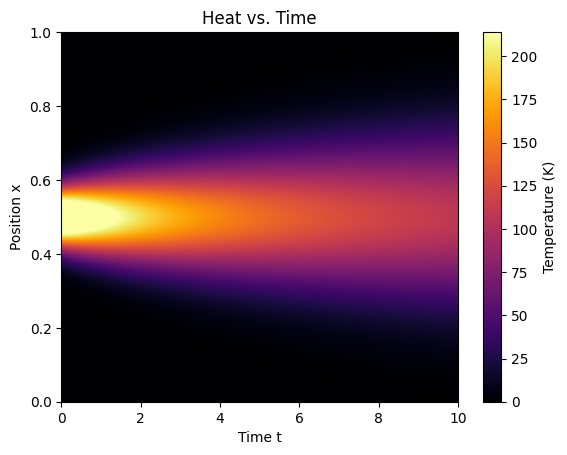

r = 0.25
k = 0.00563063063063063
N = 200
M = 1776
h = 0.005
k = 0.00563063063063063
r = 0.25


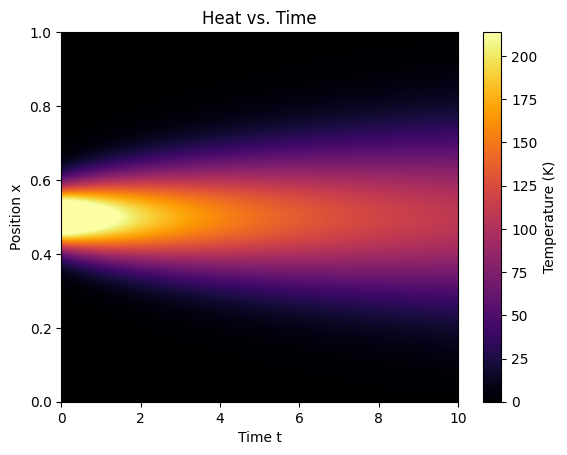

r = 0.5
k = 0.01126126126126126
N = 200
M = 888
h = 0.005
k = 0.01126126126126126
r = 0.5


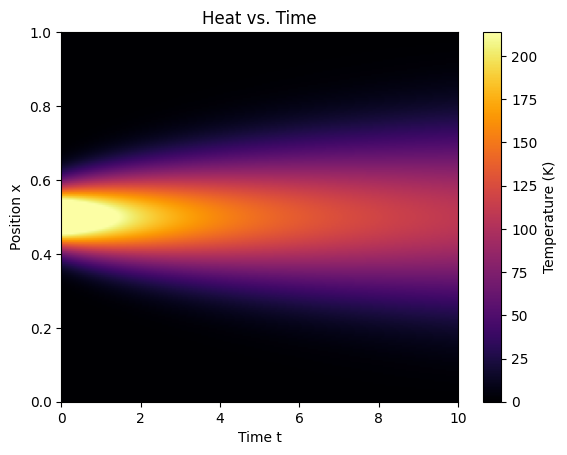

r = 0.6
k = 0.013513513513513513
N = 200
M = 740
h = 0.005
k = 0.013513513513513513
r = 0.6


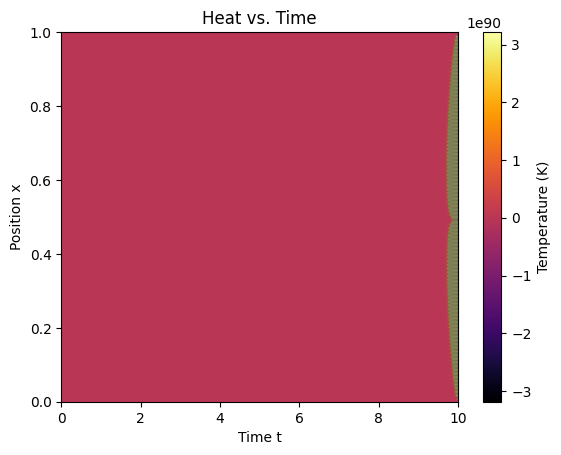

r = 0.75
k = 0.016891891891891893
N = 200
M = 592
h = 0.005
k = 0.016891891891891893
r = 0.75


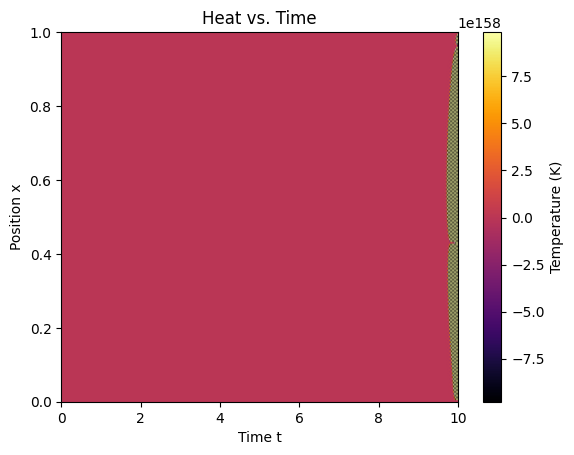

r = 1.0
k = 0.02252252252252252
N = 200
M = 444
h = 0.005
k = 0.02252252252252252
r = 1.0


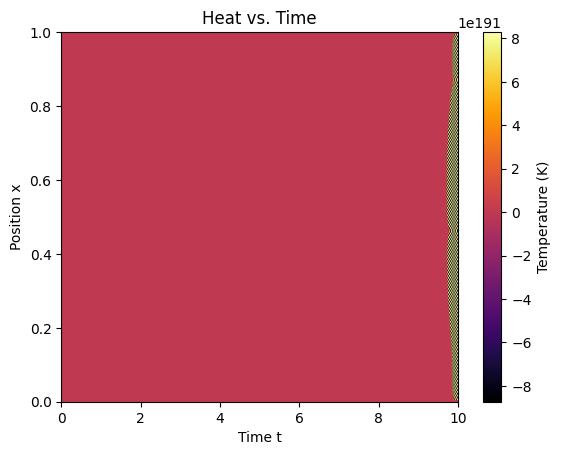

r = 0.1
k = 0.0022522522522522522
N = 200
M = 4440
h = 0.005
k = 0.0022522522522522522
r = 0.1


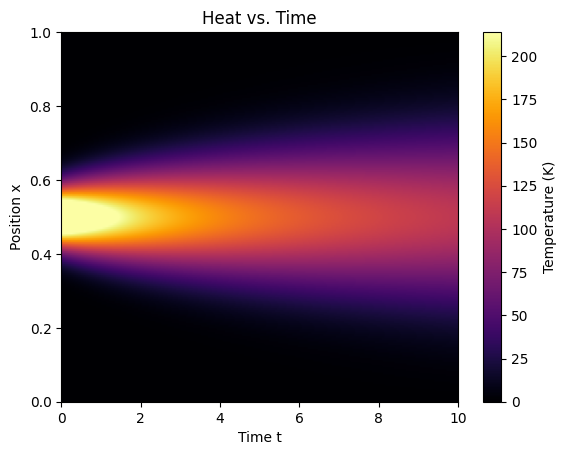

r = 0.25
k = 0.00563063063063063
N = 200
M = 1776
h = 0.005
k = 0.00563063063063063
r = 0.25


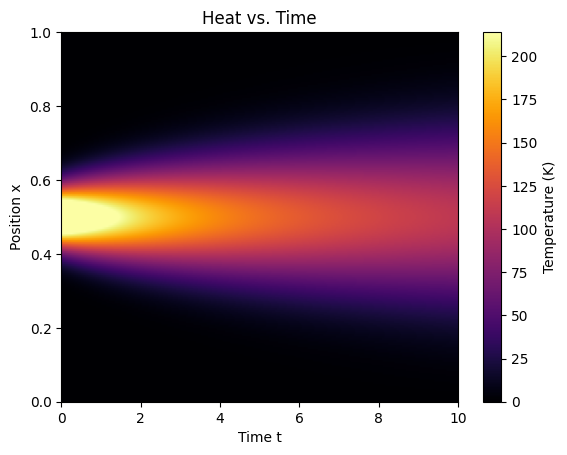

r = 0.5
k = 0.01126126126126126
N = 200
M = 888
h = 0.005
k = 0.01126126126126126
r = 0.5


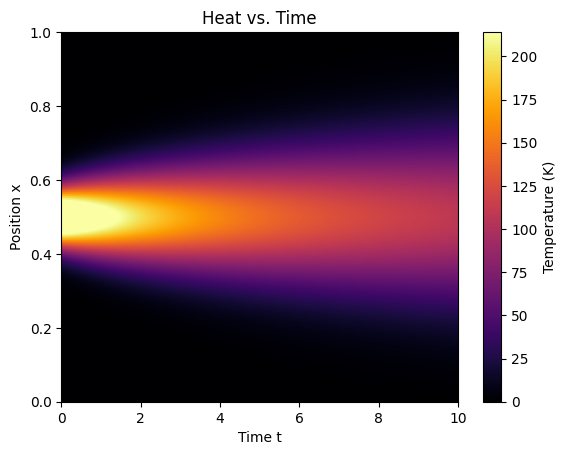

r = 0.6
k = 0.013513513513513513
N = 200
M = 740
h = 0.005
k = 0.013513513513513513
r = 0.6


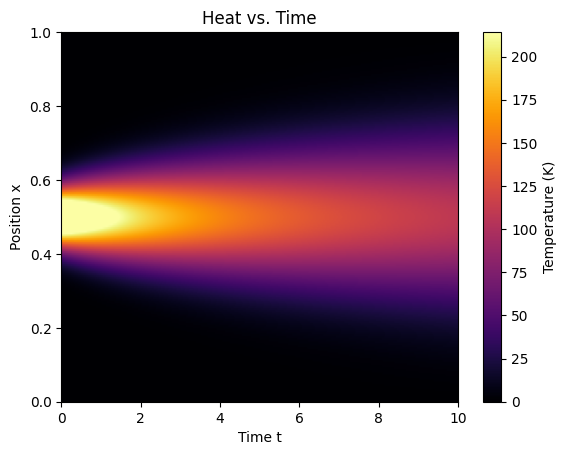

r = 0.75
k = 0.016891891891891893
N = 200
M = 592
h = 0.005
k = 0.016891891891891893
r = 0.75


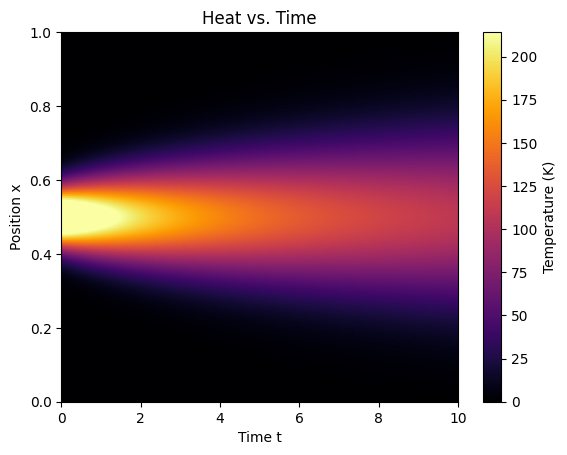

r = 1.0
k = 0.02252252252252252
N = 200
M = 444
h = 0.005
k = 0.02252252252252252
r = 1.0


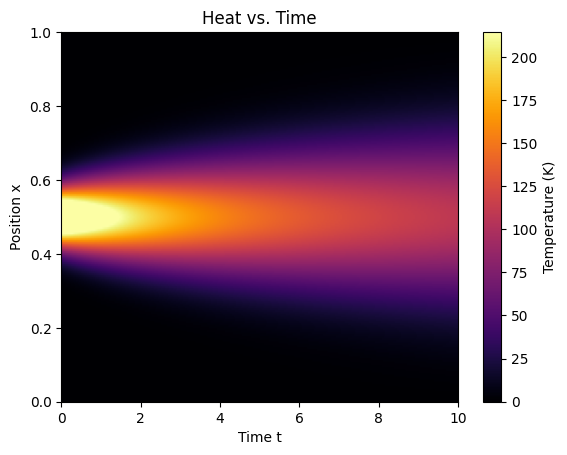

In [ ]:
# stability analysis
t_max_stab = 10
r_values = [0.10, 0.25, 0.50, 0.60, 0.75, 1.00]

for r in r_values:
    time_step = r * h**2 / alpha

    print("r =", r)
    print("k =", time_step)

    x, u = explicit_method(time_step, h, t_max_stab, alpha, BC1, BC2, L)

    plot_xt_stability(u, L, t_max_stab)


r_values = [0.10, 0.25, 0.50, 0.60, 0.75, 1.00]

for r in r_values:
    time_step = r * h**2 / alpha

    print("r =", r)
    print("k =", time_step)

    x, u = implicit_method(time_step, h, t_max_stab, alpha, BC1, BC2, L, 1e-6)

    plot_xt_stability(u, L, t_max_stab)

N = 200
M = 50000
h = 0.005
k = 0.002
r = 0.0888
N = 200
M = 50000
h = 0.005
k = 0.002
r = 0.0888


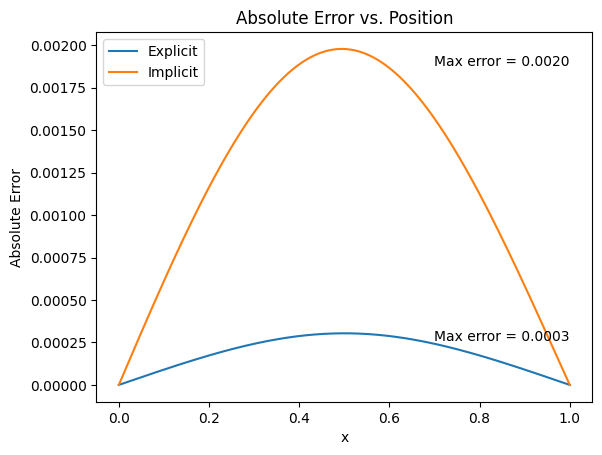

N = 200
M = 10000
h = 0.005
k = 0.01
r = 0.444
N = 200
M = 10000
h = 0.005
k = 0.01
r = 0.444


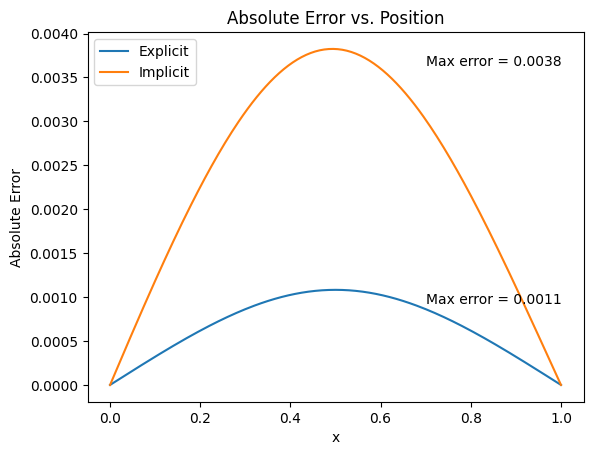

In [ ]:
# accuracy testing

# visually compare numerical vs analytical
#x, u_ex = explicit_method(k, h, t_max, alpha, BC1, BC2, L)
#x, u_im = implicit_method(k, h, t_max, alpha, BC1, BC2, L, 1e-8)
#plot_numerical_vs_analytical_snapshots(x, u_ex, L, alpha, t_max)
#plot_numerical_vs_analytical_snapshots(x, u_im, L, alpha, t_max)

t_max_acc = 100

k_values = [0.002, 0.010]

for k_val in k_values:
    x, u_ex = explicit_method(k_val, h, t_max_acc, alpha, BC1, BC2, L)
    x, u_im = implicit_method(k_val, h, t_max_acc, alpha, BC1, BC2, L, 1e-6)

    # compute error

    u_final_ex = u_ex[:, -1] # final time step solution slice
    u_final_im = u_im[:, -1]

    u_exact = analytical_on_grid(x, t_max_acc, L, alpha) # analytical soln on the same grid as numerical soln
    max_err_ex, err_ex = compute_error(x, u_final_ex, u_exact)
    max_err_im, err_im = compute_error(x, u_final_im, u_exact)

    plt.plot(x, err_ex, label="Explicit")
    plt.plot(x, err_im, label="Implicit")
    plt.title("Absolute Error vs. Position")
    plt.xlabel("x")
    plt.ylabel("Absolute Error")
    plt.text(0.70 * L, 0.85 * max_err_ex, f"Max error = {max_err_ex:.4f}")
    plt.text(0.70 * L, 0.95 * max_err_im, f"Max error = {max_err_im:.4f}")
    plt.legend()
    plt.show()

N = 25
M = 50000
h = 0.04
k = 0.002
r = 0.0013875
N = 25
M = 50000
h = 0.04
k = 0.002
r = 0.0013875
N = 50
M = 50000
h = 0.02
k = 0.002
r = 0.00555
N = 50
M = 50000
h = 0.02
k = 0.002
r = 0.00555
N = 100
M = 50000
h = 0.01
k = 0.002
r = 0.0222
N = 100
M = 50000
h = 0.01
k = 0.002
r = 0.0222
N = 200
M = 50000
h = 0.005
k = 0.002
r = 0.0888
N = 200
M = 50000
h = 0.005
k = 0.002
r = 0.0888


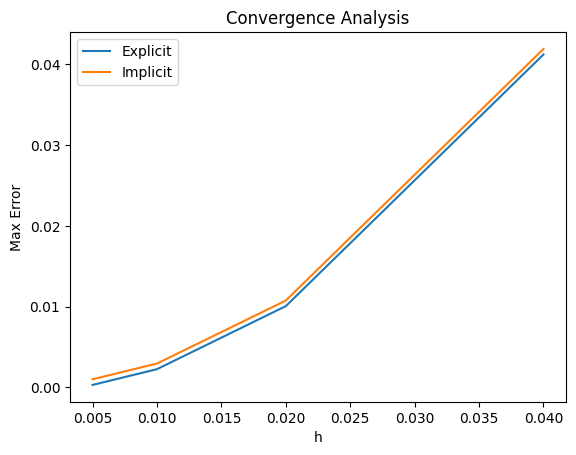

In [ ]:
# convergence
t_max_conv = 100

h_values = [0.04, 0.02, 0.01, 0.005]
ex_err_values = []
im_err_values = []

for h_val in h_values:
    x, u_ex = explicit_method(k, h_val, t_max_conv, alpha, BC1, BC2, L)
    x, u_im = implicit_method(k, h_val, t_max_conv, alpha, BC1, BC2, L, 1e-8)

    u_final_ex = u_ex[:, -1] # final time step solution slice
    u_final_im = u_im[:, -1]

    u_exact = analytical_on_grid(x, t_max_conv, L, alpha) # analytical soln on the same grid as numerical soln
    max_err_ex, err_ex = compute_error(x, u_final_ex, u_exact)
    max_err_im, err_im = compute_error(x, u_final_im, u_exact)
    ex_err_values.append(max_err_ex)
    im_err_values.append(max_err_im)

plt.plot(h_values, ex_err_values, label="Explicit")
plt.plot(h_values, im_err_values, label="Implicit")
plt.xlabel("h")
plt.ylabel("Max Error")
plt.title("Convergence Analysis")
plt.legend()
plt.show()

N = 50
M = 1000
h = 0.02
k = 0.05
r = 0.13875
N = 50
M = 1000
h = 0.02
k = 0.05
r = 0.13875


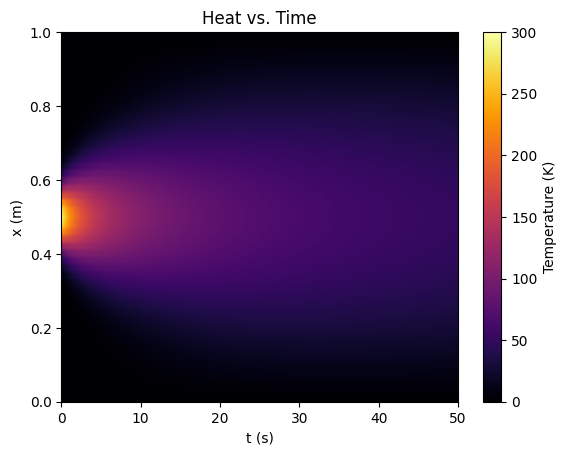

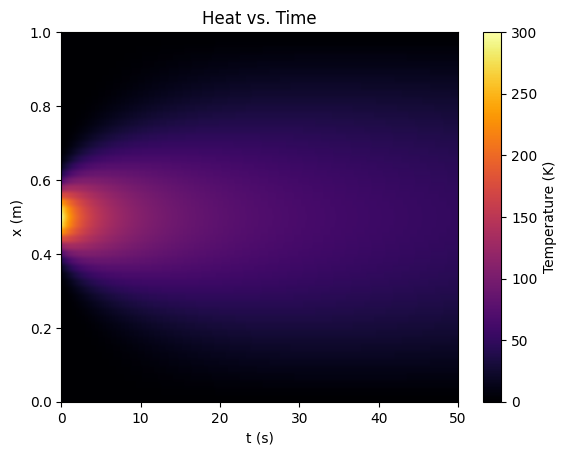

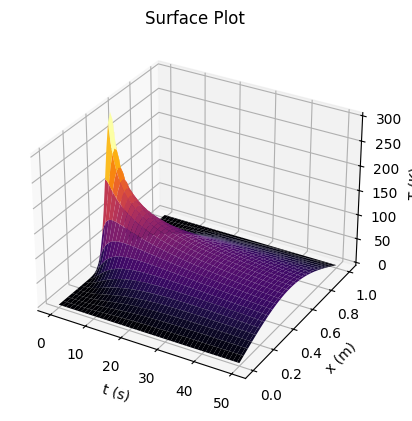

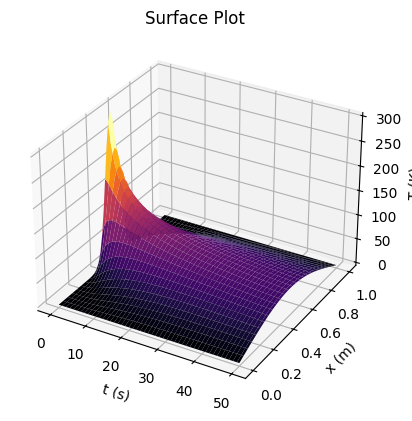

In [ ]:
t_max_plot = 50

h_plot = 0.02
k_plot = 0.05

x, u_ex = explicit_method(k_plot, h_plot, t_max_plot, alpha, BC1, BC2, L)
x, u_im = implicit_method(k_plot, h_plot, t_max_plot, alpha, BC1, BC2, L, 1e-6)

# plotting
plot_xt(u_ex, L, t_max_plot)
plot_xt(u_im, L, t_max_plot)

plot_time_evolution(u_ex, L)
plot_time_evolution(u_im, L)

plot_colorbar_time_evolution(u_ex, L, t_max_plot)
plot_colorbar_time_evolution(u_im, L, t_max_plot)

plot_3dmesh(u_ex, L, t_max_plot)
plot_3dmesh(u_im, L, t_max_plot)

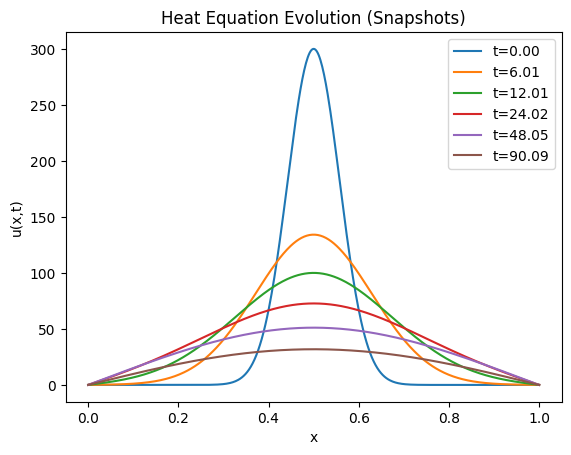

In [ ]:

# analytical solution
analytical_solution(L, alpha, t_max)


N = 200
M = 150000
h = 0.005
k = 0.002
r = 0.0888


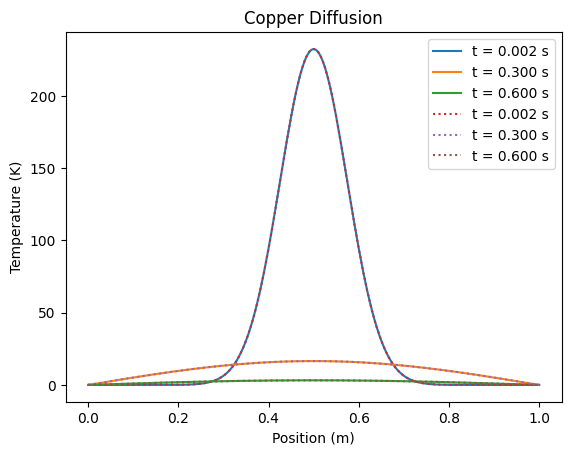

N = 200
M = 150000
h = 0.005
k = 0.002
r = 0.00112


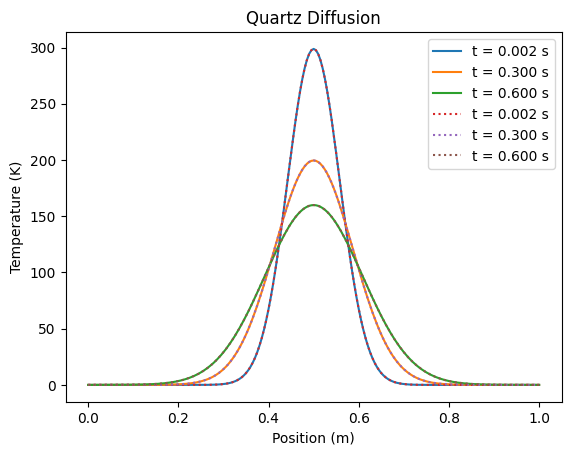

In [ ]:
# Copper simulation
x, u_im_copper = implicit_method(k, h, t_max, copper_alpha, BC1, BC2, L, 1e-6)

u_exact1 = analytical_on_grid(x, time_steps[0], L, copper_alpha)
u_exact2 = analytical_on_grid(x, time_steps[1], L, copper_alpha)
u_exact3 = analytical_on_grid(x, time_steps[2], L, copper_alpha)

u_im1 = u_im_copper[:, int(time_steps[0] / k)]
u_im2 = u_im_copper[:, int(time_steps[1] / k)]
u_im3 = u_im_copper[:, int(time_steps[2] / k)]

plt.plot(x, u_exact1, label=f"t = {time_steps[0] * k:.3f} s")
plt.plot(x, u_exact2, label=f"t = {time_steps[1] * k:.3f} s")
plt.plot(x, u_exact3, label=f"t = {time_steps[2] * k:.3f} s")

plt.plot(x, u_im1, label=f"t = {time_steps[0] * k:.3f} s", ls=":")
plt.plot(x, u_im2, label=f"t = {time_steps[1] * k:.3f} s", ls=":")
plt.plot(x, u_im3, label=f"t = {time_steps[2] * k:.3f} s", ls=":")

plt.legend()
plt.xlabel("Position (m)")
plt.ylabel("Temperature (K)")
plt.title("Copper Diffusion")
plt.show()

# Quartz simulation
x, u_im_quartz = implicit_method(k, h, t_max, quartz_alpha, BC1, BC2, L, 1e-6)

u_exact1 = analytical_on_grid(x, time_steps[0], L, quartz_alpha)
u_exact2 = analytical_on_grid(x, time_steps[1], L, quartz_alpha)
u_exact3 = analytical_on_grid(x, time_steps[2], L, quartz_alpha)

u_im1 = u_im_quartz[:, int(time_steps[0] / k)]
u_im2 = u_im_quartz[:, int(time_steps[1] / k)]
u_im3 = u_im_quartz[:, int(time_steps[2] / k)]

plt.plot(x, u_exact1, label=f"t = {time_steps[0] * k:.3f} s")
plt.plot(x, u_exact2, label=f"t = {time_steps[1] * k:.3f} s")
plt.plot(x, u_exact3, label=f"t = {time_steps[2] * k:.3f} s")

plt.plot(x, u_im1, label=f"t = {time_steps[0] * k:.3f} s", ls=":")
plt.plot(x, u_im2, label=f"t = {time_steps[1] * k:.3f} s", ls=":")
plt.plot(x, u_im3, label=f"t = {time_steps[2] * k:.3f} s", ls=":")

plt.legend()
plt.xlabel("Position (m)")
plt.ylabel("Temperature (K)")
plt.title("Quartz Diffusion")
plt.show()
